# **CIS 5450 Final Project - Uber/Lyft Price Prediction**
*Joan Condron, Dina Eloseily, Swathi Prakash*

# 1. Introduction and Background

For our final project, we wanted to understand the factors determining price for Uber and Lyft ride hailing services. The launch of ride hailing services was a huge disruption to the transportation industry and gained popularity due to its ease of use and lower price compared to conventional taxis. However, as investors put pressure on ride sharing companies to be profitable, prices have increased. The results may be interesting for ridesharing services to validate the efficacy of their pricing algorithms, and could further lead to the companies being able to forecast demand and revenue. This analysis is also interesting  for consumers who want to understand how to find rides for lower prices.


The dataset `rideshare_df` has ~693k records with 57 columns including information on price, time, destination, ride type and various weather features. We implemented different EDA techniques in order to explore and understand the data. The results of this analysis are detailed below.


#2. Import and Data ETL

The necessary python packages were installed and imported. The dataset was downloaded from Kaggle. Pandas and PandasSQL were used to load the file into a dataframe and complete data processing.

In [ ]:
!pip install pandasql

  Preparing metadata (setup.py) ... done
  Created wheel for pandasql: filename=pandasql-0.7.3-py3-none-any.whl size=26773 sha256=c03a5da7895ef314c25c8d97bab56444b0725a8e0b376c164e3c5a5a996f6d31
  Stored in directory: /root/.cache/pip/wheels/68/5d/a5/edc271b998f909801d7956959f699b976cc9896075dc47c153
Successfully built pandasql


In [ ]:
import pandas as pd
import numpy as np
from folium.plugins import HeatMap
from matplotlib import pyplot as plt
import seaborn as sns
from pandasql import sqldf
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score, f1_score
import folium
from PIL import Image
from IPython.display import display
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import xgboost as xgb

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Create the kaggle directory
!mkdir ~/.kaggle

In [ ]:
# Read the uploaded kaggle.json file
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/

In [ ]:
# Download dataset
!kaggle datasets download -d brllrb/uber-and-lyft-dataset-boston-ma

Dataset URL: https://www.kaggle.com/datasets/brllrb/uber-and-lyft-dataset-boston-ma
License(s): CC0-1.0


In [ ]:
# Unzip folder in Colab content folder
!unzip /content/uber-and-lyft-dataset-boston-ma.zip

Archive:  /content/uber-and-lyft-dataset-boston-ma.zip
  inflating: rideshare_kaggle.csv    


In [ ]:
# Read the csv file and save it to a dataframe called "rideshare_df"
rideshare_df = pd.read_csv('rideshare_kaggle.csv')

# View the first five rows
rideshare_df.head()

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800


# 3. EDA

### 3.1 Preliminary Data Analysis

To get a better sense of the data, we did some exploratory data analysis and made some supporting visualizations.

In [ ]:
# Analyze the data types in rideshare_df
rideshare_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693071 entries, 0 to 693070
Data columns (total 57 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           693071 non-null  object 
 1   timestamp                    693071 non-null  float64
 2   hour                         693071 non-null  int64  
 3   day                          693071 non-null  int64  
 4   month                        693071 non-null  int64  
 5   datetime                     693071 non-null  object 
 6   timezone                     693071 non-null  object 
 7   source                       693071 non-null  object 
 8   destination                  693071 non-null  object 
 9   cab_type                     693071 non-null  object 
 10  product_id                   693071 non-null  object 
 11  name                         693071 non-null  object 
 12  price                        637976 non-null  float64
 13 

In [ ]:
# Output summary statistics about the data
rideshare_df.describe()

,timestamp,hour,day,month,price,distance,surge_multiplier,latitude,longitude,temperature,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
count,6.930710e+05,693071.000000,693071.000000,693071.000000,637976.000000,693071.000000,693071.000000,693071.000000,693071.000000,693071.000000,...,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05,693071.000000,6.930710e+05
mean,1.544046e+09,11.619137,17.794365,11.586684,16.545125,2.189430,1.013870,42.338172,-71.066151,39.584388,...,0.037374,1.544044e+09,33.457774,1.544042e+09,45.261313,1.544047e+09,29.731002,1.544048e+09,41.997343,1.544048e+09
std,6.891925e+05,6.948114,9.982286,0.492429,9.324359,1.138937,0.091641,0.047840,0.020302,6.726084,...,0.055214,6.912028e+05,6.467224,6.901954e+05,5.645046,6.901353e+05,7.110494,6.871862e+05,6.936841,6.910777e+05
min,1.543204e+09,0.000000,1.000000,11.000000,2.500000,0.020000,1.000000,42.214800,-71.105400,18.910000,...,0.000000,1.543162e+09,15.630000,1.543122e+09,33.510000,1.543154e+09,11.810000,1.543136e+09,28.950000,1.543187e+09
25%,1.543444e+09,6.000000,13.000000,11.000000,9.000000,1.280000,1.000000,42.350300,-71.081000,36.450000,...,0.000000,1.543421e+09,30.170000,1.543399e+09,42.570000,1.543439e+09,27.760000,1.543399e+09,36.570000,1.543439e+09
50%,1.543737e+09,12.000000,17.000000,12.000000,13.500000,2.160000,1.000000,42.351900,-71.063100,40.490000,...,0.000400,1.543770e+09,34.240000,1.543727e+09,44.680000,1.543788e+09,30.130000,1.543745e+09,40.950000,1.543788e+09
75%,1.544828e+09,18.000000,28.000000,12.000000,22.500000,2.920000,1.000000,42.364700,-71.054200,43.580000,...,0.091600,1.544807e+09,38.880000,1.544789e+09,46.910000,1.544814e+09,35.710000,1.544789e+09,44.120000,1.544818e+09
max,1.545161e+09,23.000000,30.000000,12.000000,97.500000,7.860000,3.000000,42.366100,-71.033000,57.220000,...,0.145900,1.545152e+09,43.100000,1.545192e+09,57.870000,1.545109e+09,40.050000,1.545134e+09,57.200000,1.545109e+09


The summary statistics indicate a few takeaways:

*   7.86 miles is the maximum distance of any ride in the dataset, indicating that the results from this analysis are mainly applicable to relatively short rides.

*   There are very small differences between the minumum and maximum latitudes and longitudes, supporting that all rides were relatively close to each other within the city of Boston.

*   The temperature range is about 39 degrees Farenheit, providing a range of temperatures in the dataset to draw conclusions from, while still limiting weather to that of November and December in Boston.

In [ ]:
# Find the number of null values in each column
rideshare_df.isnull().sum()

,0
id,0
timestamp,0
hour,0
day,0
month,0
datetime,0
timezone,0
source,0
destination,0
cab_type,0


The only column with null values is `price`. Null values are removed in the next step.

In [ ]:
# Drop null values
rideshare_df = rideshare_df.dropna(subset=["price"])

In [ ]:
# Display first 10 rows of data
rideshare_df.head(10)

,id,timestamp,hour,day,month,datetime,timezone,source,destination,cab_type,...,precipIntensityMax,uvIndexTime,temperatureMin,temperatureMinTime,temperatureMax,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime
0,424553bb-7174-41ea-aeb4-fe06d4f4b9d7,1.544953e+09,9,16,12,2018-12-16 09:30:07,America/New_York,Haymarket Square,North Station,Lyft,...,0.1276,1544979600,39.89,1545012000,43.68,1544968800,33.73,1545012000,38.07,1544958000
1,4bd23055-6827-41c6-b23b-3c491f24e74d,1.543284e+09,2,27,11,2018-11-27 02:00:23,America/New_York,Haymarket Square,North Station,Lyft,...,0.1300,1543251600,40.49,1543233600,47.30,1543251600,36.20,1543291200,43.92,1543251600
2,981a3613-77af-4620-a42a-0c0866077d1e,1.543367e+09,1,28,11,2018-11-28 01:00:22,America/New_York,Haymarket Square,North Station,Lyft,...,0.1064,1543338000,35.36,1543377600,47.55,1543320000,31.04,1543377600,44.12,1543320000
3,c2d88af2-d278-4bfd-a8d0-29ca77cc5512,1.543554e+09,4,30,11,2018-11-30 04:53:02,America/New_York,Haymarket Square,North Station,Lyft,...,0.0000,1543507200,34.67,1543550400,45.03,1543510800,30.30,1543550400,38.53,1543510800
4,e0126e1f-8ca9-4f2e-82b3-50505a09db9a,1.543463e+09,3,29,11,2018-11-29 03:49:20,America/New_York,Haymarket Square,North Station,Lyft,...,0.0001,1543420800,33.10,1543402800,42.18,1543420800,29.11,1543392000,35.75,1543420800
5,f6f6d7e4-3e18-4922-a5f5-181cdd3fa6f2,1.545071e+09,18,17,12,2018-12-17 18:25:12,America/New_York,Haymarket Square,North Station,Lyft,...,0.0221,1545066000,34.19,1545048000,40.66,1545022800,27.39,1545044400,34.97,1545080400
6,462816a3-820d-408b-8549-0b39e82f65ac,1.543209e+09,5,26,11,2018-11-26 05:03:00,America/New_York,Back Bay,Northeastern University,Lyft,...,0.1245,1543251600,40.67,1543233600,46.46,1543255200,37.45,1543291200,43.81,1543251600
7,474d6376-bc59-4ec9-bf57-4e6d6faeb165,1.543780e+09,19,2,12,2018-12-02 19:53:04,America/New_York,Back Bay,Northeastern University,Lyft,...,0.0916,1543770000,36.32,1543726800,50.80,1543788000,35.84,1543748400,50.13,1543788000
8,4f9fee41-fde3-4767-bbf1-a00e108701fb,1.543818e+09,6,3,12,2018-12-03 06:28:02,America/New_York,Back Bay,Northeastern University,Lyft,...,0.0004,1543852800,43.09,1543896000,57.02,1543852800,39.90,1543896000,56.35,1543852800
9,8612d909-98b8-4454-a093-30bd48de0cb3,1.543316e+09,10,27,11,2018-11-27 10:45:22,America/New_York,Back Bay,Northeastern University,Lyft,...,0.1425,1543338000,36.34,1543377600,46.91,1543320000,32.43,1543377600,44.01,1543320000


It's clear from examining the first ten rows of data, that certain columns are categorical variables. To understand the unique categories in each column, we ran the following commands:

In [ ]:
# Unique values for source
rideshare_df['source'].unique()

array(['Haymarket Square', 'Back Bay', 'North End', 'North Station',
       'Beacon Hill', 'Boston University', 'Fenway', 'South Station',
       'Theatre District', 'West End', 'Financial District',
       'Northeastern University'], dtype=object)

In [ ]:
# Unique values for destination
rideshare_df['destination'].unique()

array(['North Station', 'Northeastern University', 'West End',
       'Haymarket Square', 'South Station', 'Fenway', 'Theatre District',
       'Beacon Hill', 'Back Bay', 'North End', 'Financial District',
       'Boston University'], dtype=object)

Note that the `source` and `destination` categories are identical.

In [ ]:
# Unique values for cab type, corresponds to rideshare company: Lyft or Uber
rideshare_df['cab_type'].unique()

array(['Lyft', 'Uber'], dtype=object)

In [ ]:
# Unique values for product_id, these are the types of ride/product (i.e UberXL)
rideshare_df['product_id'].unique()

array(['lyft_line', 'lyft_premier', 'lyft', 'lyft_luxsuv', 'lyft_plus',
       'lyft_lux', '6f72dfc5-27f1-42e8-84db-ccc7a75f6969',
       '6c84fd89-3f11-4782-9b50-97c468b19529',
       '55c66225-fbe7-4fd5-9072-eab1ece5e23e',
       '9a0e7b09-b92b-4c41-9779-2ad22b4d779d',
       '6d318bcc-22a3-4af6-bddd-b409bfce1546',
       '997acbb5-e102-41e1-b155-9df7de0a73f2'], dtype=object)

In [ ]:
# Unique values for name, these are the types of ride/product (i.e UberXL)
rideshare_df['name'].unique()

array(['Shared', 'Lux', 'Lyft', 'Lux Black XL', 'Lyft XL', 'Lux Black',
       'UberXL', 'Black', 'UberX', 'WAV', 'Black SUV', 'UberPool'],
      dtype=object)

Note that `product_id` maps to `name`; `product_id` for the uber rides are unclear codings that are clarified by `name`. As a result we've chosen to use `name` rather than `product_id`.

Columns that were deemed redundant or unneccesary for our analysis will be removed after EDA.

## 3.2 Data Visualizations

### 3.2.1 Ride Density Across Boston

This Geomap helps visualize where the concentration of rides per location in Boston. (See related supplemental material in Appendix)

In [ ]:
# Calculate maximum and minimum latitude
max_latitude = np.max(rideshare_df['latitude'])
min_latitude = np.min(rideshare_df['latitude'])

# Display maximum and minimum latitude
print(f"Maximum Latitude: {max_latitude}")
print(f"Minimum Latitude: {min_latitude}")

Maximum Latitude: 42.3661
Minimum Latitude: 42.2148


In [ ]:
# Calculate maximum and minimum longitude
max_longitude = np.max(rideshare_df['longitude'])
min_longitude = np.min(rideshare_df['longitude'])

# Display maximum and minimum lpngitude
print(f"Maximum Longitude: {max_longitude}")
print(f"Minimum Longitude: {min_longitude}")

Maximum Longitude: -71.033
Minimum Longitude: -71.1054


In [ ]:
heat_data = rideshare_df[['latitude', 'longitude']].values.tolist()

# Clean and filter
rideshare_df = rideshare_df.dropna(subset=['latitude', 'longitude'])
df1 = rideshare_df[
    (rideshare_df['latitude'].between(42.2, 42.4)) &
    (rideshare_df['longitude'].between(-71.2, -70.0))
]

# Create map
boston_map = folium.Map(location=[42.3601, -71.0589], zoom_start=12)

# Heatmap data
heat_data = df1[['latitude', 'longitude']].values.tolist()
HeatMap(heat_data, radius=8).add_to(boston_map)

# Display the Geomap
boston_map

### 3.2.2 Uber Vs Lyft

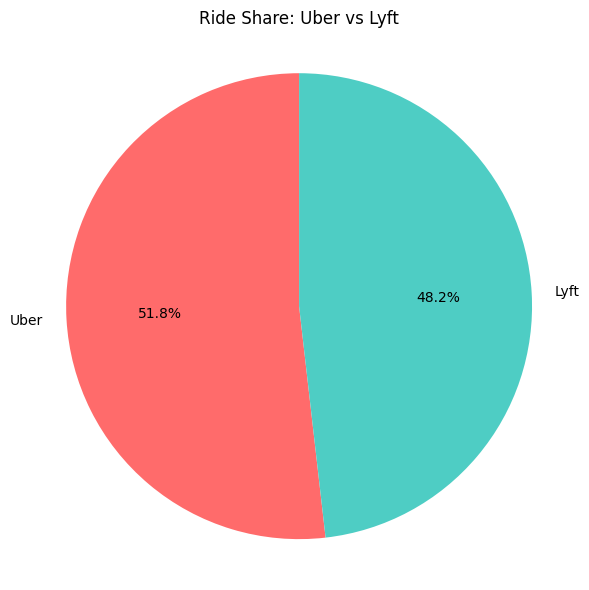

In [ ]:
# Calculate the number of rides of Uber vs. Lyft
source_counts = rideshare_df['cab_type'].value_counts()

# Display the plot
plt.figure(figsize=(6, 6))
plt.pie(
    source_counts,
    labels=source_counts.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=['#ff6b6b', '#4ecdc4']
)

plt.title('Ride Share: Uber vs Lyft')
plt.axis('equal')
plt.tight_layout()
plt.show()

Our dataset is slightly dominated by Uber rides over Lyft rides. This slightly uneven split explains the discrepancy in following visualization.

### 3.2.3 Uber vs Lyft Rides by Precipitation Probability

Intuitively, one might think that the volume of rides would be strongly correlated with precipitation. As it rains, people may be more inclined to use a rideshare service as to not get rained on, or avoid public transport delays caused by weather. Here, precipitation is shown as a percentage.

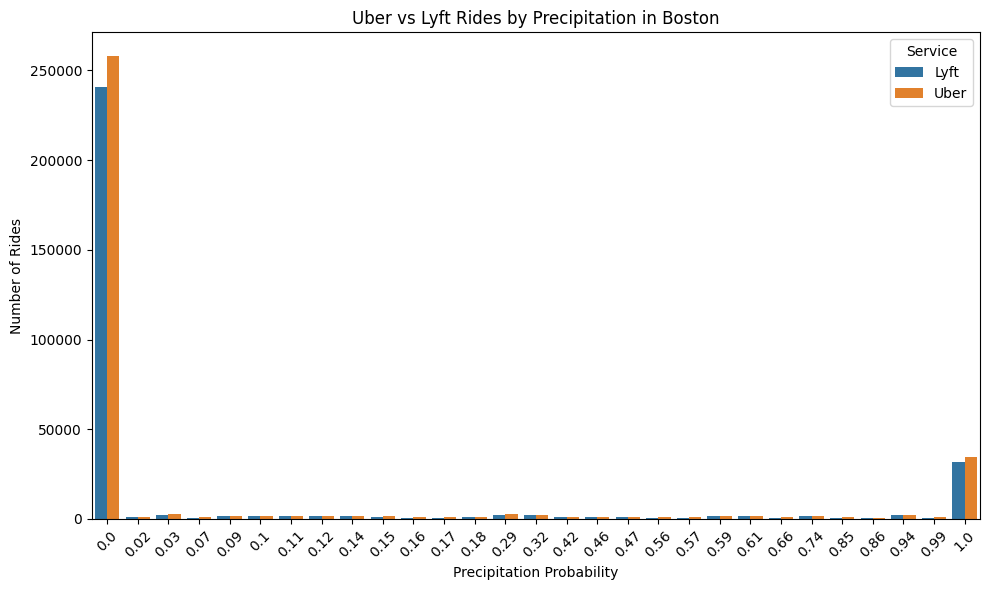

In [ ]:
# Uber vs Lyft Rides by Precipitation Probability
# Group by weather and service source
weather_comparison = rideshare_df.groupby(['precipProbability', 'cab_type']).size().reset_index(name='ride_count')

# Display the plot
plt.figure(figsize=(10, 6))
sns.barplot(data=weather_comparison, x='precipProbability', y='ride_count', hue='cab_type')
plt.title('Uber vs Lyft Rides by Precipitation in Boston')
plt.xlabel('Precipitation Probability')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45)
plt.legend(title='Service')
plt.tight_layout()
plt.show()

As shown by the figure above, between 0 and 100% precipitation, there is no apparent trend; most rides are at zero precipiation and a small chunk (though not indicative to any significant trend or observation between rain and ride volume) is at 100% precipitation.

### 3.2.4 Ride Volume by Weather Condition

The bar chart below shows the ride volume in various weather conditions. (See related supplemental material in Appendix)

<ipython-input-28-8c1c74d3a619>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=weather_counts, x='short_summary', y='ride_count', palette='Blues_d')


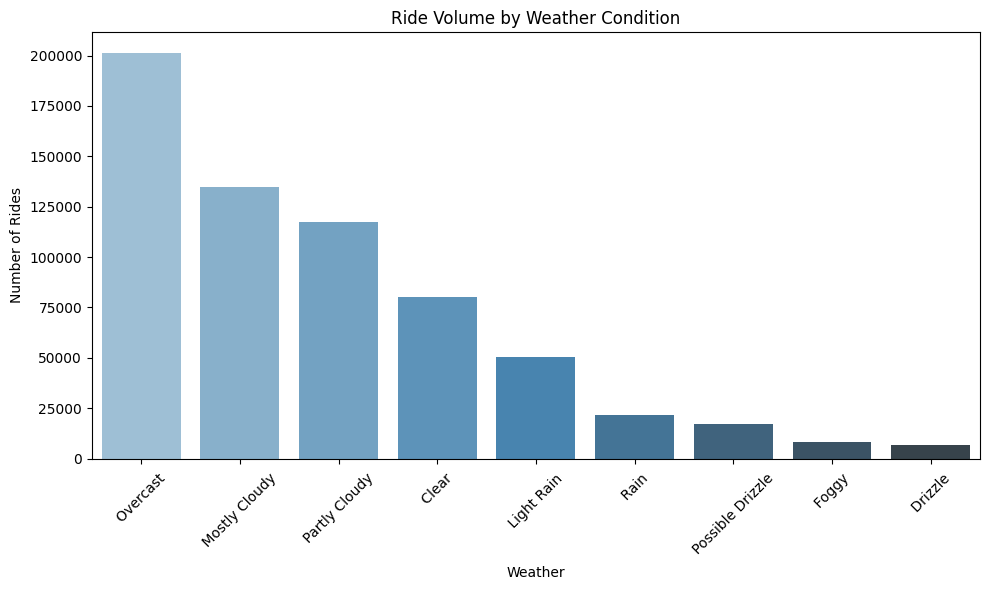

In [ ]:
# Ride Volume by Weather Condition (Using catagorical variable, not numeric)
weather_counts = rideshare_df['short_summary'].value_counts().reset_index()
weather_counts.columns = ['short_summary', 'ride_count']

# Display the plot
plt.figure(figsize=(10, 6))
sns.barplot(data=weather_counts, x='short_summary', y='ride_count', palette='Blues_d')
plt.title('Ride Volume by Weather Condition')
plt.xlabel('Weather')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The results show that most rides were taken in overcast, mostly cloudy, and partly cloudy conditions.

### 3.2.5 Number of Rides Over Time

The below line graph shows the number of rides by date.

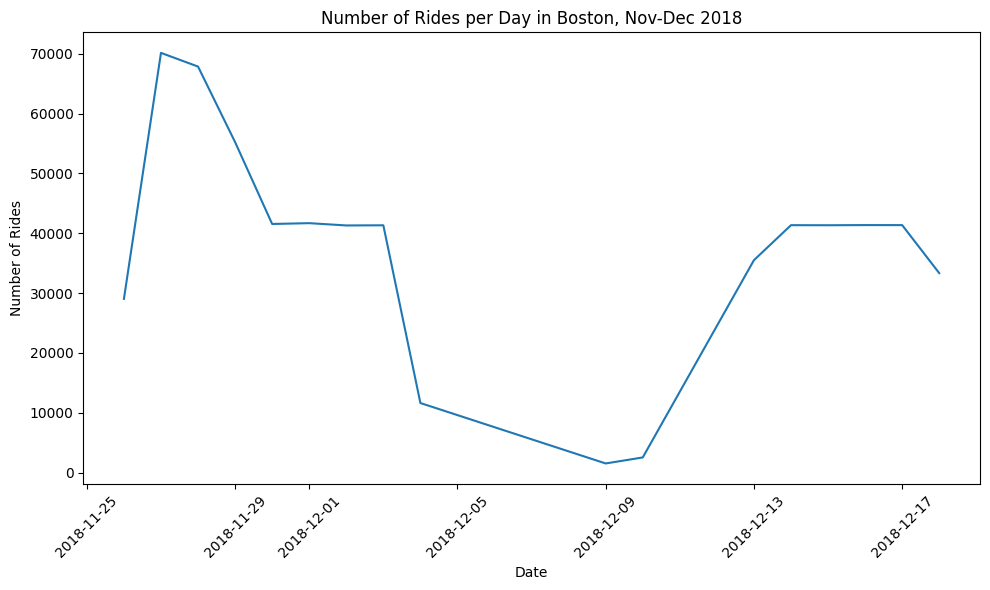

In [ ]:
# Explore the number of rides over time
count_by_day = rideshare_df.copy()
count_by_day = count_by_day.dropna(subset=['price'])
count_by_day['datetime']=pd.to_datetime(count_by_day['datetime'])
count_by_day['date'] = count_by_day['datetime'].dt.date
daily_counts = count_by_day.groupby('date').size().reset_index(name='ride_count')

# Display the plot
plt.figure(figsize=(10,6))
sns.lineplot(data=daily_counts, x='date', y='ride_count')
plt.title('Number of Rides per Day in Boston, Nov-Dec 2018')
plt.xlabel('Date')
plt.ylabel('Number of Rides')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

One observation is that a prominent spike in number of rides in the graph corresponds to the Thanksgiving Holiday. (Potentially, a more robust catalog of event information in Boston during November and December in 2018, may have been useful to be able to overlay on a graph like this.)

### 3.2.6 Price per Distance

The line graph below indicates a relationship between the price and the distance of the ride.

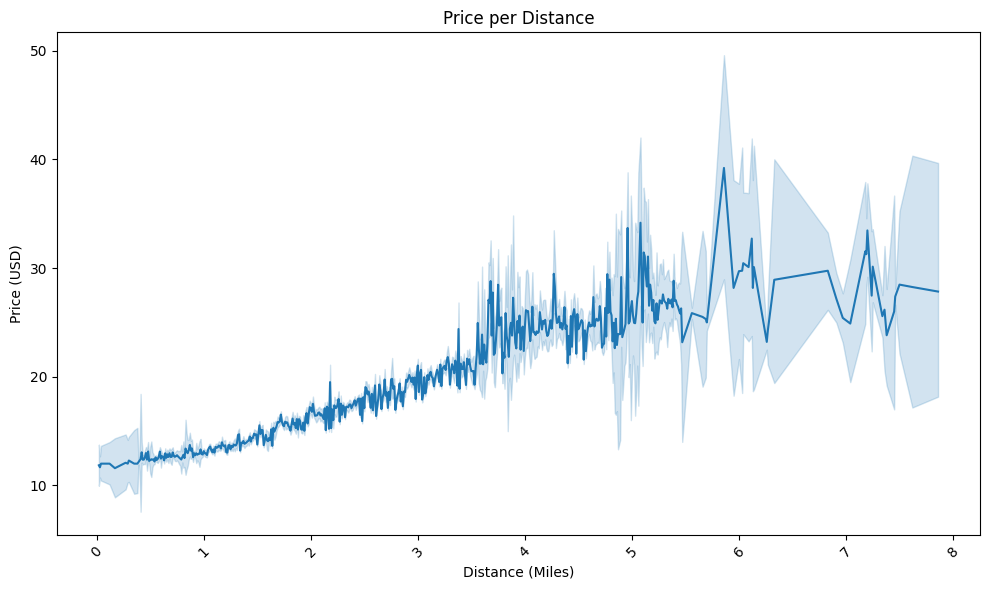

In [ ]:
# Visualize the relationship between distance and price of rides
plt.figure(figsize=(10,6))
sns.lineplot(data=count_by_day, x='distance', y='price')
plt.title('Price per Distance')
plt.xlabel('Distance (Miles)')
plt.ylabel('Price (USD)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 3.2.7 Price by Demand

The box plot below seeks to explore if there is a difference in average price on days where demand is higher. Preliminarily, price does not appear to be affected by demand.

demand_level
high    16.543075
low     16.548584
Name: price, dtype: float64


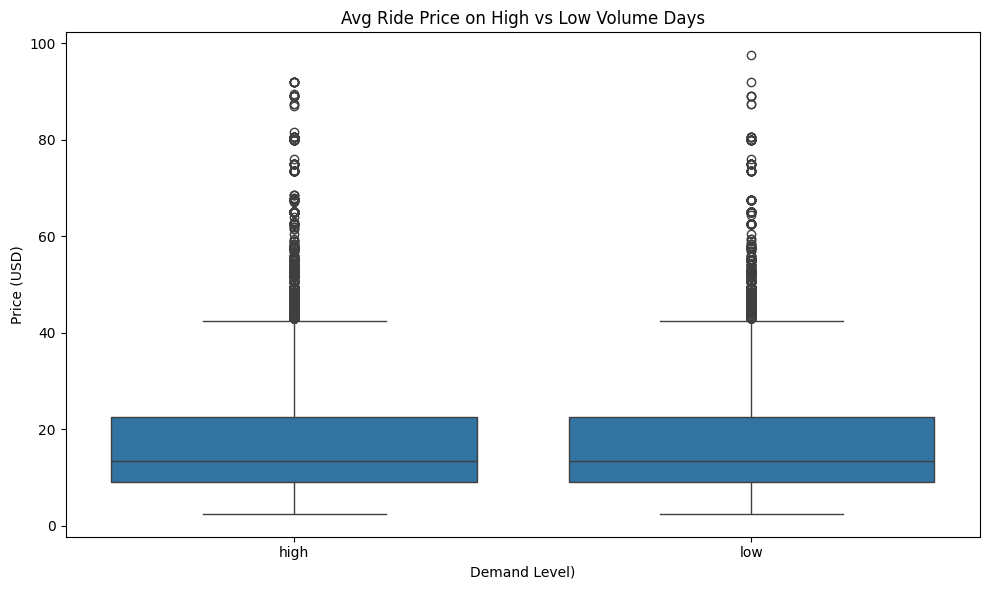

In [ ]:
#Plot Price by Demand Level on a given day
median_count = daily_counts['ride_count'].median()
count_by_day = pd.merge(count_by_day, daily_counts, on='date',how='left')
count_by_day['demand_level'] = count_by_day['ride_count'].apply(lambda x: 'high' if x>median_count else 'low')
avg_prices = count_by_day.groupby('demand_level')['price'].mean()
print(avg_prices)

# Display the plot
plt.figure(figsize=(10,6))
sns.boxplot(data=count_by_day, x='demand_level', y='price')
plt.title('Avg Ride Price on High vs Low Volume Days')
plt.xlabel('Demand Level)')
plt.ylabel('Price (USD)')
plt.tight_layout()
plt.show()

As promised, now we will be dropping columns/variables that we've deemed not useful.

In [ ]:
# Drop columns
rideshare_df.drop(columns=['id', 'timestamp',  'timezone', 'product_id', 'long_summary'], inplace=True)


`id`- the ride id, which is in an alphanumeric encoding, i.e. '424553bb-7174-41ea-aeb4-fe06d4f4b9d7', is not insightful information to keep in the dataframe for modeling.

`timestamp`- will be using other features available to represent time.

`timezone`- of the form 'America/New_York'; all rides are in the same timezone as they're all in Boston.

`product_id`- as explored in Section 1, `product_id` is redundant and unclear and maps directly to column `cab_type` which is more intrepretable.

`long_summary`- decided to drop this feature due to the fact that though this variable provides slightly more specific descriptions compared to

`short_summary`, as shown in the appendix, `short_summary` was not a particularly insightful feature. Therefore, the inclusion of a more descriptive feature seems redundant.

# 4. Data Preprocessing and Feature Engineering

### 4.1 Identifying Outliers

We wanted to observer outliers in the data for`price` and `distance`. A boxplot was made for each to visually check for outliers.

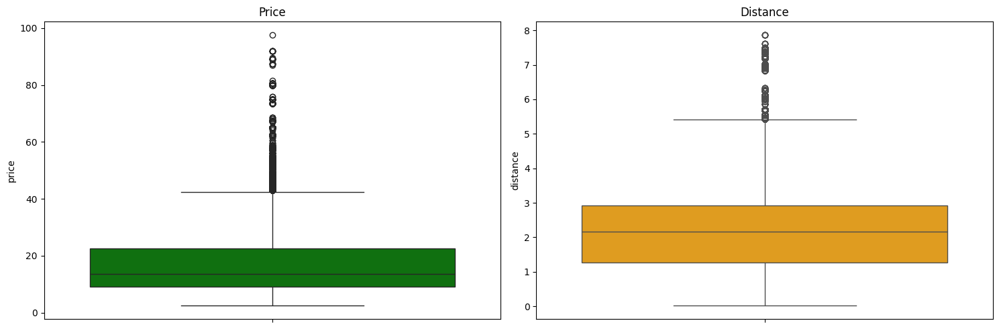

In [ ]:
# Create subplots for the three box plots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 3 columns

# Box plot for 'price'
sns.boxplot(y=rideshare_df['price'], ax=axes[0], color='green')
axes[0].set_title('Price')

# Box plot for 'distance'
sns.boxplot(y=rideshare_df['distance'], ax=axes[1], color='orange')
axes[1].set_title('Distance')

# Show the plots
plt.tight_layout()
plt.show()

In [ ]:
# Calculate number of price outliers
price_Q1 = rideshare_df['price'].quantile(0.25)
price_Q3 = rideshare_df['price'].quantile(0.75)
price_IQR = price_Q3 - price_Q1
price_outliers = rideshare_df[(rideshare_df['price'] < (price_Q1 - 1.5 * price_IQR)) | (rideshare_df['price'] > (price_Q3 + 1.5 * price_IQR))]
num_price_outliers=len(price_outliers)
print(f"Number of price outliers: {num_price_outliers}")

Number of price outliers: 5589


In [ ]:
# Calculate number of distance outliers
distance_Q1 = rideshare_df['distance'].quantile(0.25)
distance_Q3 = rideshare_df['distance'].quantile(0.75)
distance_IQR = distance_Q3 - distance_Q1
distance_outliers = rideshare_df[(rideshare_df['distance'] < (distance_Q1 - 1.5 * distance_IQR)) | (rideshare_df['distance'] > (distance_Q3 + 1.5 * distance_IQR))]
num_distance_outliers=len(distance_outliers)
print(f"Number of distance outliers: {num_distance_outliers}")

Number of distance outliers: 6672


We decided to not remove the `price` and `distance` outliers as they were outliers from longer and more expensive trips. The dataset is for Boston so most of the trips are within the city traveling small distances, however, having a longer trip is a real-world possibility. We wanted our model to account for these outliers.

### 4.2 Correlation Heat Map/Feature Selection

### 4.2.1 Heat Map for price and temperature related weather features

We used heat maps to identify weather features for removal. Two heat maps were created since there were so many weather related variables. The first heat map displays the correlation between `price` and all temperature variables. The second heat map displays the correlation between `price` and all other non-temperate weather variables. The heat maps show the included variables on both the x and y axes. The red line down the diagonal is 1 and corresponds to when the same variable meets each other. A variable will always have a correlation of 1 with itself. Red is a high correlation while blue is a lower correlation.

In [ ]:
 # List all of the weather related columns and price for correlation analysis
weather_columns=['price','temperature', 'apparentTemperature', 'precipIntensity', 'precipProbability', 'humidity', 'windSpeed',
       'windGust', 'windGustTime', 'visibility', 'temperatureHigh',
       'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime',
       'apparentTemperatureLow', 'apparentTemperatureLowTime',
       'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex',
       'visibility.1', 'ozone', 'sunriseTime', 'sunsetTime', 'moonPhase',
       'precipIntensityMax', 'uvIndexTime', 'temperatureMin',
       'temperatureMinTime', 'temperatureMax', 'temperatureMaxTime',
       'apparentTemperatureMin', 'apparentTemperatureMinTime',
       'apparentTemperatureMax', 'apparentTemperatureMaxTime']

In [ ]:
# Determined it would be better to break up the columns so the correlation heatmap is readable
# List all of the temperate related columns and price for correlation analysis
weather_temperature_columns=['price', 'temperature', 'apparentTemperature', 'temperatureHigh', 'temperatureHighTime', 'temperatureLow', 'temperatureLowTime',
       'apparentTemperatureHigh', 'apparentTemperatureHighTime','apparentTemperatureLow', 'apparentTemperatureLowTime', 'temperatureMin', 'temperatureMinTime',
       'temperatureMax', 'temperatureMaxTime', 'apparentTemperatureMin', 'apparentTemperatureMinTime','apparentTemperatureMax', 'apparentTemperatureMaxTime',]

In [ ]:
# Create the correlation matrix for price and temeperature features
weather_temperature_correlation_matrix=rideshare_df[weather_temperature_columns].corr()

Text(0.5, 1.0, 'Correlation Heatmap of Temperature Features')

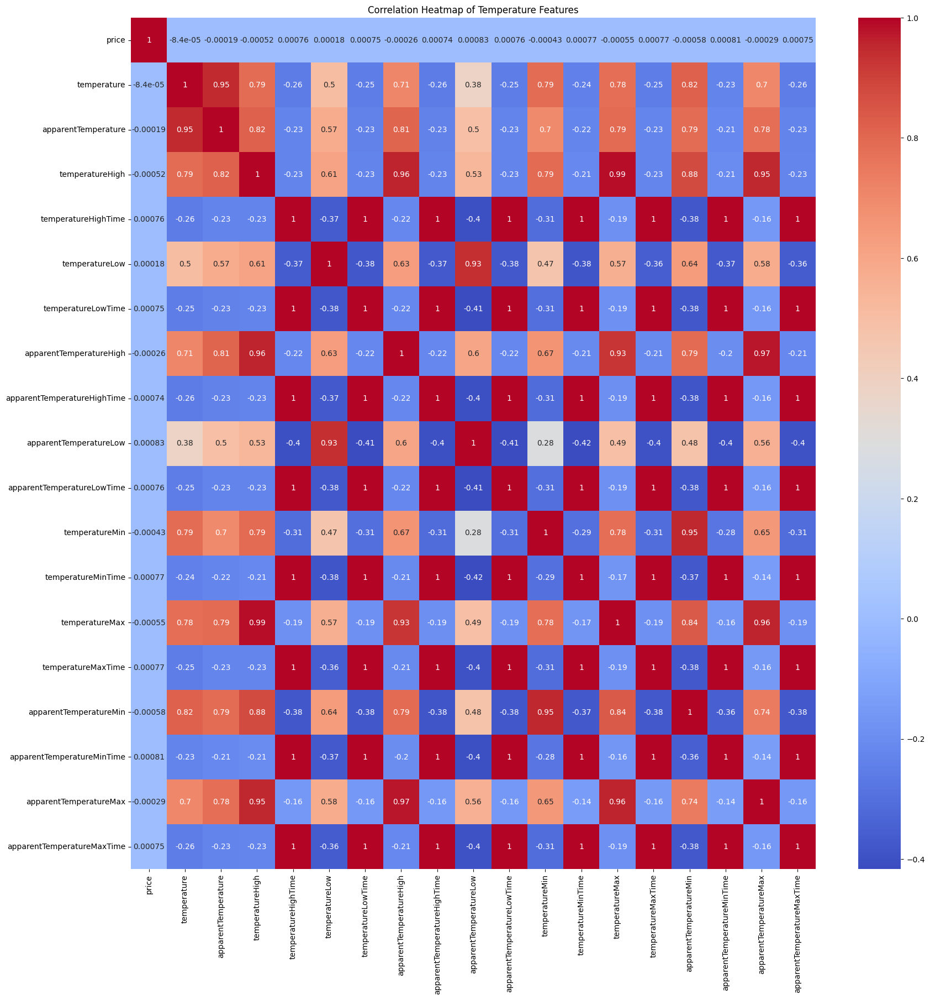

In [ ]:
# Plot and display the correlation heat map to quickly visualize the temperature features correlation with price
plt.figure(figsize=(20, 20))
sns.heatmap(weather_temperature_correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Temperature Features')

The heat map for `price` and temperature variables indicated that `price` is not highly correlated with any of the temperature variables since the color on the top row and first column are light blue.  

### 4.2.2 Heat Map for Price and Non-temperature related weather features

This is the second heat map for `price` and other non-temperature weather variables.

In [ ]:
# List all of the reamaining weather columns (non temperature related) and price for correlation analysis
weather_non_temperature_columns=['price', 'precipIntensity', 'precipProbability', 'humidity', 'windSpeed', 'windGust', 'windGustTime',
                                 'visibility', 'dewPoint', 'pressure', 'windBearing', 'cloudCover', 'uvIndex','visibility.1', 'ozone',
                                 'sunriseTime', 'sunsetTime', 'moonPhase', 'precipIntensityMax', 'uvIndexTime']

In [ ]:
# Create the correlation matrix for price and other weather features
weather_non_temperature_correlation_matrix=rideshare_df[weather_non_temperature_columns].corr()

Text(0.5, 1.0, 'Correlation Heatmap of Weather Features')

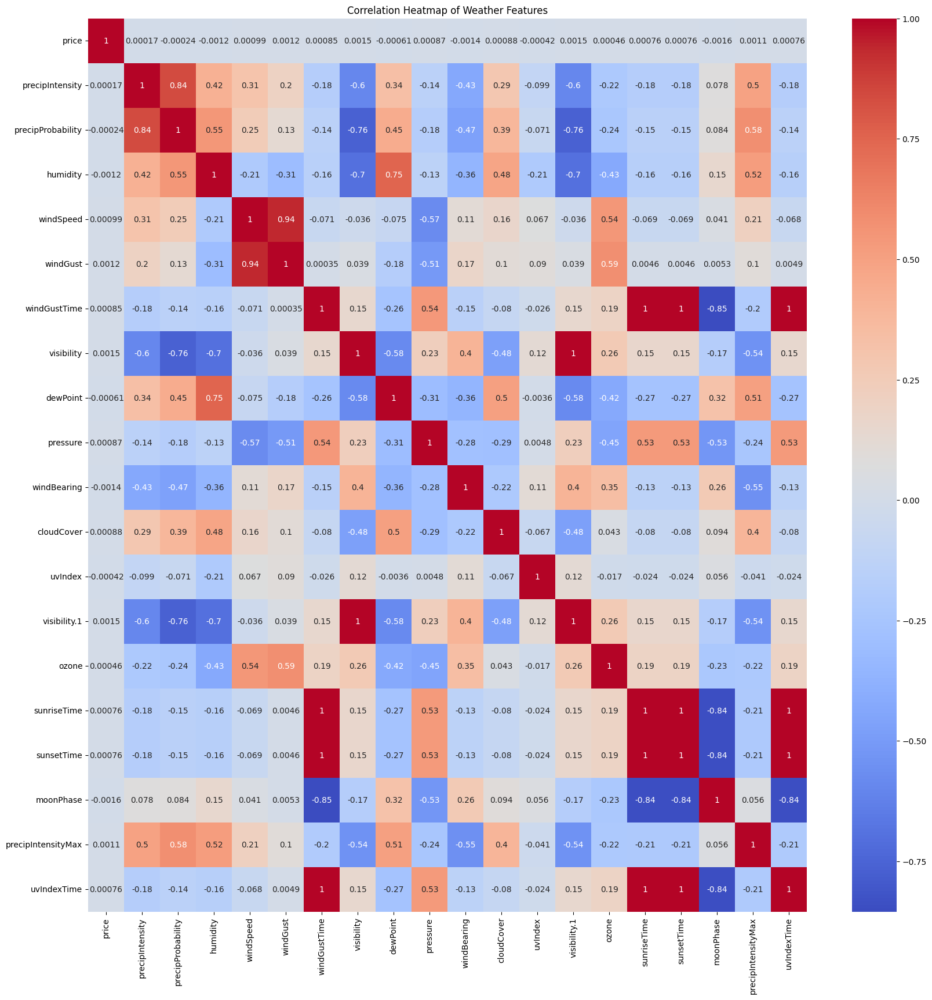

In [ ]:
# Plot and display the correlation heat map to quickly visualize the other weather features correlation with price
plt.figure(figsize=(20, 20))
sns.heatmap(weather_non_temperature_correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Weather Features')

The heat map for `price` and non-temperature weather variables indicated that `price` is not highly correlated with any of the variables since the color on the top row and first column are grey.  

We dropped the weather related variables to narrow down the number of features since the weather variables do not have a strong relationship with `price`.

In [ ]:
# Remove price from weather feature list so it does not get dropped from the data
weather_columns.remove('price')

# Drop all of the weather related columns as we saw they have a very low correlation with price
rideshare_df.drop(columns=weather_columns, inplace=True)

## 4.3 Verifying the weather in the dataframe is accurate

The data results with respect to weather contradict intuition, so as a sanity check, we've taken a separate Kaggle weather dataset to see if a correlation map to these external weather variables make a difference.

### 4.3.1 Importing external weather dataset from Kaggle

In [ ]:
!kaggle datasets download -d swaroopmeher/boston-weather-2013-2023

Dataset URL: https://www.kaggle.com/datasets/swaroopmeher/boston-weather-2013-2023
License(s): CC0-1.0


In [ ]:
# Unzip folder in Colab content folder
!unzip /content/boston-weather-2013-2023.zip

Archive:  /content/boston-weather-2013-2023.zip
  inflating: boston_weather_data.csv  


In [ ]:
weather_extra_df = pd.read_csv('/content/boston_weather_data.csv')

In [ ]:
weather_extra_df.head()

,time,tavg,tmin,tmax,prcp,wdir,wspd,pres
0,2013-03-01,3.2,1.1,5.0,0.0,342.0,15.1,1002.7
1,2013-03-02,3.1,1.1,5.6,0.0,307.0,14.4,1004.2
2,2013-03-03,2.6,0.6,6.1,0.0,NaN,14.4,1002.6
3,2013-03-04,1.8,-0.6,5.0,0.0,303.0,28.1,1003.0
4,2013-03-05,2.9,0.0,6.1,0.0,NaN,16.6,1013.5


The dataset is 3653 rows × 8 columns.

This external weather dataset spans 2013-2023, and the Uber/Lyft dataset only spans November and December of 2018. We'll extract that time from the weather dataset and merge this dataset with the Uber/Lyft dataset to see if the correlation map changes.

In [ ]:
# Convert the 'date' column to datetime objects
weather_extra_df['date'] = pd.to_datetime(weather_extra_df['time'])

# Filter the data for November and December 2018
filtered_weather_df = weather_extra_df[
    (weather_extra_df['date'].dt.month.isin([11, 12])) &
    (weather_extra_df['date'].dt.year == 2018)
]

In [ ]:
# Rename the columns
filtered_weather_df = filtered_weather_df.rename(
    columns={
        #'time': 'date',
        'tavg': 'avg_temp',
        'tmin': 'min_temp',
        'tmax': 'max_temp',
        'prcp': 'precipitation',
        'wdir': 'wind_direction',
        'wspd': 'wind_speed',
        'pres': 'air_pressure'
    }
)

In [ ]:
# Display the new dataframe
filtered_weather_df.head()

,weather_df_time,weather_df_avg_temp,weather_df_min_temp,weather_df_max_temp,weather_df_precipitation,weather_df_wind_direction,weather_df_wind_speed,weather_df_air_pressure,weather_df_date
2071,2018-11-01,14.4,11.7,17.8,0.3,211.0,10.8,1011.6,2018-11-01
2072,2018-11-02,16.2,11.7,21.1,9.1,185.0,20.5,1007.1,2018-11-02
2073,2018-11-03,15.3,8.3,20.0,35.3,250.0,29.2,1006.4,2018-11-03
2074,2018-11-04,9.2,5.6,13.3,0.0,313.0,15.8,1030.5,2018-11-04
2075,2018-11-05,9.2,7.8,11.1,9.1,83.0,22.0,1030.7,2018-11-05


### 4.3.2 Entity Relationship Diagram

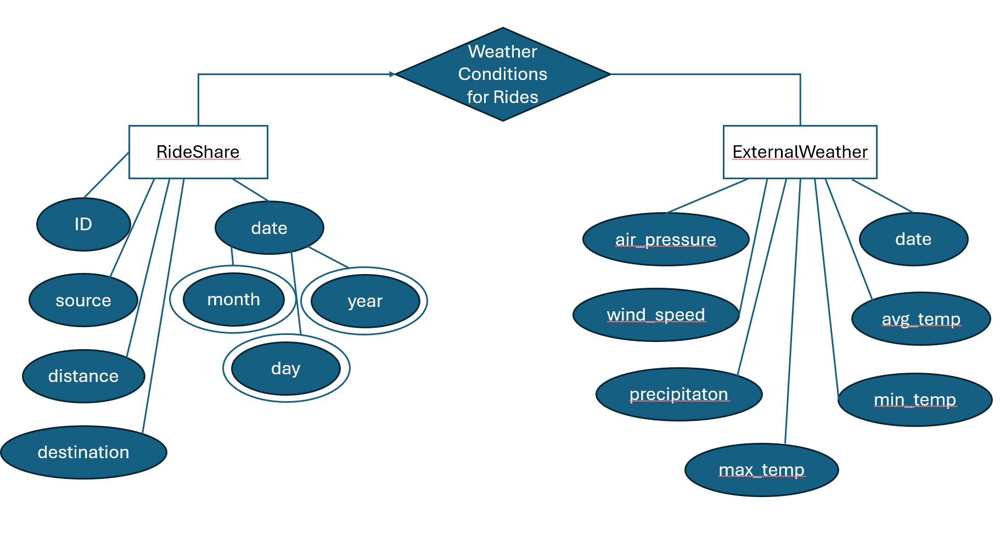

In [ ]:
# Display the ER diagram of rideshare_df and external weather data
image_path='/content/drive/MyDrive/Big Data Project/ERweather.jpg'
#img = Image.open('ERweather.jpg')
img=Image.open(image_path)
img.show()
display(img)



### 4.3.3 Analyzing the external weather dataset

In [ ]:
# Add prefix to columns to help identify which table they belong
filtered_weather_df = filtered_weather_df.add_prefix('weather_df_')


In [ ]:
#Extract date from 'datetime' column in rideshare_df:
rideshare_df['date'] = pd.to_datetime(rideshare_df['datetime']).dt.date

In [ ]:
# Analyze date values in both dataframes
rideshare_dates = rideshare_df['date'].unique()
weather_dates = filtered_weather_df['weather_df_time'].unique()
print(f"Unique dates in rideshare_df: {len(rideshare_dates)}")
print(f"Unique dates in filtered_weather_df: {len(weather_dates)}")

missing_dates = set(rideshare_dates) - set(weather_dates)
print(f"Dates in rideshare_df that are not in filtered_weather_df: {len(missing_dates)}")

Unique dates in rideshare_df: 17
Unique dates in filtered_weather_df: 61
Dates in rideshare_df that are not in filtered_weather_df: 17


In [ ]:
# Convert date column to datetime
filtered_weather_df['weather_df_time'] = pd.to_datetime(filtered_weather_df['weather_df_time']).dt.date

In [ ]:
# Analyze date values in both dataframes
rideshare_dates = rideshare_df['date'].unique()
weather_dates = filtered_weather_df['weather_df_time'].unique()
print(f"Unique dates in rideshare_df: {len(rideshare_dates)}")
print(f"Unique dates in filtered_weather_df: {len(weather_dates)}")

missing_dates = set(rideshare_dates) - set(weather_dates)
print(f"Dates in rideshare_df that are not in filtered_weather_df: {len(missing_dates)}")

Unique dates in rideshare_df: 17
Unique dates in filtered_weather_df: 61
Dates in rideshare_df that are not in filtered_weather_df: 0


In [ ]:
# Merge the two DataFrames
merged_df = pd.merge(rideshare_df, filtered_weather_df, left_on='date', right_on='weather_df_time', how='inner')

# Drop the redundant 'weather_df_date' column
merged_df = merged_df.drop(columns=['weather_df_date'])

### 4.3.4 Heatmap for external weather data

In [ ]:
# List all of the weather related columns and price for correlation analysis
XTRAweather_temperature_columns=['price','weather_df_max_temp', 'weather_df_precipitation', 'weather_df_wind_direction', 'weather_df_wind_speed', 'weather_df_air_pressure']

In [ ]:
# Create the correlation matrix for price and temeperature features
XTRAweather_temperature_correlation_matrix=merged_df[XTRAweather_temperature_columns].corr()


Text(0.5, 1.0, 'Correlation Heatmap of Features')

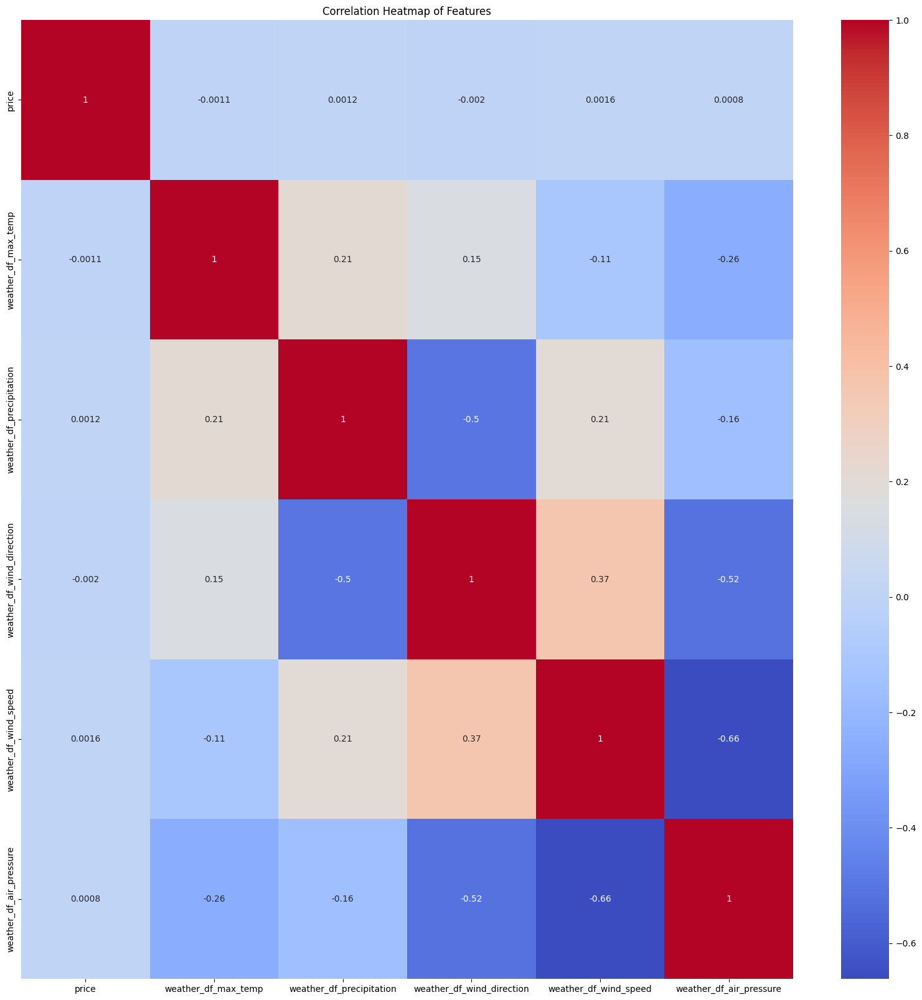

In [ ]:
# Dispay the correlation heat map
plt.figure(figsize=(20, 20))
sns.heatmap(XTRAweather_temperature_correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Features')

Just as with the original weather variables from the rideshare dataframe, this external weather dataframe does not show any strong correlation to our target variable `price`. This confirms that the original dataset has good data and it was not influential the rideshare pricing.

### 4.4 Engineering New Columns

 We were interested in exploring if the end destination such as an airport or university would impact price, however, no columns represented these features. PandasSQL was used to create the new features as it easy to do with a CASE WHEN statement.

*   `airport_flag`: a binary column representing if the trip was going to the airport (1) or not (0). This was implemented by flagging rides where the end destination was the North End as that is where the Boston airport is located.

*   `university_flag`: a binary column representing if the trip was going to a university (1) or not (0). This was implemented by flagging rides with end destinatons as Boston University or Northeastern Univeristy.

Additionally, we wanted to look at if a ride staying in the same neighboorhood even if the distance was significant would impact price

*   `same_neighborhood_flag`: a binary column representing if the trip remained in the same neighborhood (1) or not (0). This was implemented by flagging rides where the start and end neighborhood were the same.

In [ ]:
# Define a function to run SQL queries
run_query= lambda query: sqldf(query, globals())

# Define the SQL query
query= "SELECT r.*, (CASE WHEN destination='North End' THEN 1 ELSE 0 END) as airport_flag, (CASE WHEN destination in ('Boston University', 'Northeastern University') THEN 1 ELSE 0 END) as university_flag, (CASE WHEN destination=source THEN 1 ELSE 0 END) as same_neighborhood_flag FROM rideshare_df as r"

# Execute query
rideshare_df= run_query(query)

### 4.5 Ordinal Encoding

Ordinal encoding is required when there is a clear ordering among the values in the column.

We decided to include the `name` column as an ordered feature as it represents the ride type such as UberPool vs. UberXL. There is a distinct service difference between the different types of rides that Uber and Lyft offer.

*   `product_name`: resulting ordinal encoded column from mapping product types in `name` to integers. The column was renamed to provide a better description to the data it captures

In [ ]:
# Identify the ordered features in the dataset
ordered_features = ['name']

# List the values of the ordered features
ordered_categories =['Shared', 'Lux', 'Lyft', 'Lux Black XL', 'Lyft XL', 'Lux Black', 'UberXL', 'Black', 'UberX', 'WAV',
                      'BlackSUV', 'UberPool', 'Taxi']

# Map the string values to integer numbers
rideshare_df['product_name']=rideshare_df['name'].map({'UberPool':0, 'Shared':0,  'Taxi':1, 'Lyft':1, 'WAV':2, 'UberXL':3, 'Lyft XL':3,
                                                       'UberX':4, 'Lux': 4, 'Black': 5, 'Lux Black': 5, 'Black SUV':6, 'Lux Black XL':6})
# Remove the old column from the dataset
rideshare_df.drop(columns='name', inplace=True)
#rideshare_df.head()
#rideshare_df.columns

### 4.6 Nominal Encoding




For all other non-numerical columns without order, nominal encoding was implemented using OneHot encoder.

*   `source`: indicates the starting neighborhood in Boston
*   `destination`: indicates the ending neighborhood in Boston
*   `cab_type`: Uber vs Lyft
*   `short_summary`: few word description of the weather
*   `icon`: one word indicator of the weather



In [ ]:
# Identify the nominal features in the dataset
unordered_features = ['source', 'destination', 'cab_type', 'short_summary','icon'] #, 'long_summary'

# Make a copy of rideshare_df
encoded_rideshare_df= rideshare_df.copy()

# Instantiate an One Hot Encoder object and fit transform it to the data
encoder=OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_data=encoder.fit_transform(rideshare_df[unordered_features])
feature_names=encoder.get_feature_names_out(unordered_features)

# Save the new encoded data to a dataframe
encoded_df=pd.DataFrame(encoded_data, columns=feature_names, index=rideshare_df.index)

# Concatenate newly encoded data to the end of the dataframe
encoded_rideshare_df=pd.concat([encoded_rideshare_df, encoded_df], axis=1)

# Drop the original columns that have now been encodeded
encoded_rideshare_df=encoded_rideshare_df.drop(columns=unordered_features)

# Drop the first column of each encoded variables that is produced from One Hot Encoding
encoded_rideshare_df.drop(columns=['source_Back Bay', 'destination_Back Bay','cab_type_Lyft','short_summary_ Clear ', 'icon_ clear-day '], inplace=True)#, 'long_summary_ Foggy in the morning. ']
#encoded_rideshare_df.head()

# Save back to the original dataframe
rideshare_df=encoded_rideshare_df

In [ ]:
rideshare_df.drop(columns=['datetime', 'date'], inplace=True)

### 4.7 Feature Scaling and Splitting

In [ ]:
# Ensure all random states are set to 42
SEED= 42

In [ ]:
#Identify the features that were not encoded
non_encoded_features=['hour', 'day', 'month', 'distance', 'surge_multiplier', 'latitude', 'longitude']

#Defining the target variable - price
y=rideshare_df['price']

#Defining the input features
X=rideshare_df.drop(columns='price')

#Splitting the data between train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state= SEED)

In [ ]:
# Create the X_train and X_test scaled variables
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

# Instantiate a StandardScaler object
scaler=StandardScaler()

# Fit and transform on the non-encoded columns for the training and testing data
scaler.fit(X_train_scaled[non_encoded_features])
X_train_scaled[non_encoded_features] = scaler.transform(X_train_scaled[non_encoded_features])
X_test_scaled[non_encoded_features] = scaler.transform(X_test_scaled[non_encoded_features])

# 5. Modeling

## 5.1 Linear Regression

### 5.1.1 Linear Regression with L1 Normalization (Lasso)

We decided to start the modeling portion with a baseline model of Linear Regression. Since there are numerous features and we were still unsure which would be important, we decided to use linear regression with L1 normalization (Lasso regresion). Lasso regression adds a weight term to the loss function of λ*|β|which due to absolute value encourages sparsity. Sparsity is the tendency for the model to push coefficients to 0. This is useful for feature selection and is why we chose this model to start as we thought it could be a good way to narrow down the number of features

L1 Regularization Loss:

$
\mathcal{L}({\beta}) = \frac{1}{N}\sum_{i =1}^N ({x}_i - y_i)^2+ \lambda\sum_{j = 1}^D  |{\beta}_j|
$

where:

  $N$ is the number of training samples

  $D$ is the number of features




In [ ]:
# Instantiate a Lasso model and fit it to the scaled training data
l1_linear_regression_model=Lasso()
l1_linear_regression_model.fit(X_train_scaled, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.590e+06, tolerance: 4.434e+03
  model = cd_fast.enet_coordinate_descent(


Lasso()

In [ ]:
# Generate the y-label predictions on the test data
l1_y_pred = l1_linear_regression_model.predict(X_test_scaled)

# Calculate and report the MSE loss
l1_mse = mean_squared_error(y_test, l1_y_pred)
print(f"Lasso Regression Mean Squared Error: {l1_mse:.4f}")

Lasso Regression Mean Squared Error: 22.5504


In [ ]:
# Calculate and report the R^2 value for the train and test data
l1_linear_regression_score_train = l1_linear_regression_model.score(X_train_scaled, y_train)
l1_linear_regression_score_test = l1_linear_regression_model.score(X_test_scaled, y_test)

print(f"Lasso Regression R² value for training set: {l1_linear_regression_score_train :.4f}")
print(f"Lasso Regression R² value for test set: {l1_linear_regression_score_test:.4f}")

Lasso Regression R² value for training set: 0.7424
Lasso Regression R² value for test set: 0.7413


In [ ]:
# Identify features with non-zero coefficients
l1_selected_features = X.columns[l1_linear_regression_model.coef_ != 0]
print("Lasso Regression Selected Features: ", l1_selected_features)

Lasso Regression Selected Features:  Index(['distance', 'surge_multiplier', 'product_name'], dtype='object')


It was surprising when only 3 features of `distance`, `surge_multiplier`, and `product_name` only had non-zero coefficients. We were expecting more features. The features chosen make sense as distance, ride type, and surge are typically associated with lower or higher pricing. This did not really end up helping us with feature selection as we want to use somewhere between 5-10 features in our model. Next we are going to try to Ridge Regression

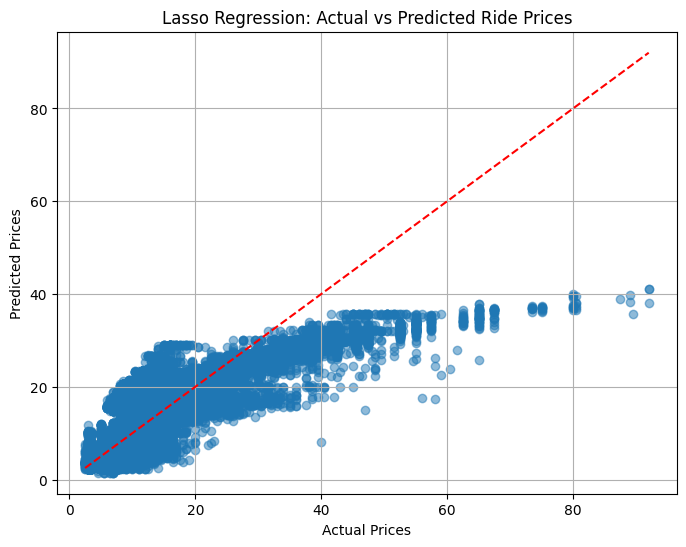

In [ ]:
# Display the Lasso Linear Regression fit to the data
plt.figure(figsize=(8,6))
plt.scatter(y_test, l1_y_pred, alpha=0.5)
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Lasso Regression: Actual vs Predicted Ride Prices")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.grid(True)
plt.show()

The above graph shows that the Lasso model is not the best fit to the data. The higher MSE loss from the model came from the right half of the graph where there are far distances between the data and predicted price from the linear fit.

### 5.1.2 Linear Regression with L2 Normalization (Ridge)

Next, we explored Linear Regression with L2 Normalization (Ride Regresion). Ridge regression adds a weight term to the loss function of λ*β^2. The regularization term in L2 causes feature weights to not be too large and is helpful to protect against overfitting. After having too few features from the Lasso Regression, we wanted to explore the coefficients of the features to understand what else is contributing to the model.

L2 Regularization Loss:

$
\mathcal{L}({\beta}) = \frac{1}{N}\sum_{i =1}^N ({x}_i - y_i)^2+ \lambda\sum_{j = 1}^D  {\beta}_j^2
$


where:

  $N$ is the number of training samples

  $D$ is the number of features




In [ ]:
# Instantiate a Lasso model and fit it to the scaled training data
l2_linear_regression_model = Ridge()
l2_linear_regression_model.fit(X_train_scaled, y_train)

Ridge()

In [ ]:
# Generate the y-label predictions on the test data
l2_y_pred = l2_linear_regression_model.predict(X_test_scaled)

# Calculate and report the MSE loss
l2_mse = mean_squared_error(y_test, l2_y_pred)
print(f"Ridge Regression Mean Squared Error: {l2_mse:.4f}")

Ridge Regression Mean Squared Error: 19.5991


In [ ]:
# Calculate and report the R^2 value for the train and test data
l2_linear_regression_score_train=l2_linear_regression_model.score(X_train_scaled, y_train)
l2_linear_regression_score_test =l2_linear_regression_model.score(X_test_scaled, y_test)

print(f"Ridge Regression R² value for training set: {l2_linear_regression_score_train:.4f}")
print(f"Ridge Regression R² value for test set: {l2_linear_regression_score_test:.4f}")

Ridge Regression R² value for training set: 0.7755
Ridge Regression R² value for test set: 0.7752


In [ ]:
l2_selected_features_zero = X.columns[l2_linear_regression_model.coef_ != 0]
print("Ridge Regression Selected Features: ", l2_selected_features_zero)

l2_selected_features_pos = X.columns[l2_linear_regression_model.coef_ >.1]
print("Selected Features: ", l2_selected_features_pos)

Ridge Regression Selected Features:  Index(['hour', 'day', 'month', 'distance', 'surge_multiplier', 'latitude',
       'longitude', 'airport_flag', 'university_flag', 'product_name',
       'source_Beacon Hill', 'source_Boston University', 'source_Fenway',
       'source_Financial District', 'source_Haymarket Square',
       'source_North End', 'source_North Station',
       'source_Northeastern University', 'source_South Station',
       'source_Theatre District', 'source_West End', 'destination_Beacon Hill',
       'destination_Boston University', 'destination_Fenway',
       'destination_Financial District', 'destination_Haymarket Square',
       'destination_North End', 'destination_North Station',
       'destination_Northeastern University', 'destination_South Station',
       'destination_Theatre District', 'destination_West End', 'cab_type_Uber',
       'short_summary_ Drizzle ', 'short_summary_ Foggy ',
       'short_summary_ Light Rain ', 'short_summary_ Mostly Cloudy ',
    

In [ ]:
# Display all of the features and the coefficients of the model
l2_coefficients = l2_linear_regression_model.coef_
l2_feature_names = l2_linear_regression_model.feature_names_in_
for i, coef in enumerate(l2_coefficients):
  print(f"Coefficient for {l2_feature_names[i]}: {coef}")

Coefficient for hour: 0.010053322863092486
Coefficient for day: -0.011444290596819465
Coefficient for month: -0.011146941658108433
Coefficient for distance: 3.2739388555294164
Coefficient for surge_multiplier: 1.7398053539944858
Coefficient for latitude: 0.008533921503161571
Coefficient for longitude: -0.0035314078835895104
Coefficient for airport_flag: 0.005690809248811386
Coefficient for university_flag: -0.036514836083978645
Coefficient for same_neighborhood_flag: 0.0
Coefficient for product_name: 3.5380390482568425
Coefficient for source_Beacon Hill: -0.31790025301053254
Coefficient for source_Boston University: -0.2737310627643626
Coefficient for source_Fenway: -0.08904295971515694
Coefficient for source_Financial District: 0.3545891931934246
Coefficient for source_Haymarket Square: 0.35719880716516406
Coefficient for source_North End: 0.5148051043795646
Coefficient for source_North Station: 0.07404810135771597
Coefficient for source_Northeastern University: -0.33712633465350417
C

The features with the most influence in the model from Ridge Regression are  `product_name`, `distance`, `surge_multiplier`, `cab_type`, and various one hot columns related to source and end destinations.

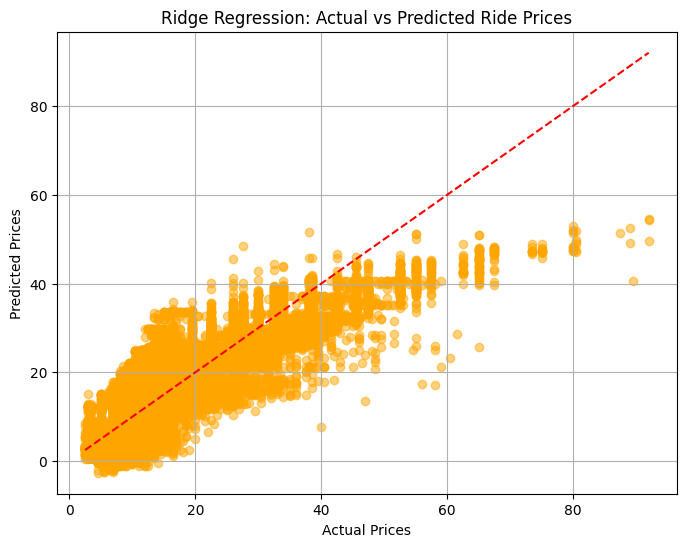

In [ ]:
# Display the Ridge Linear Regression fit to the data
plt.figure(figsize=(8,6))
plt.scatter(y_test, l2_y_pred, alpha=0.5, color='orange')
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Ridge Regression: Actual vs Predicted Ride Prices")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.grid(True)
plt.show()

The Ridge regression fits the data better than the Lasso regression as indicated by the slightly lower MSE loss at 19.60 compared to 22.5. Again, the graph shows that a linear model does not fit the right side of the graph well.

For the next two models, we decided to explore ensembles models of Random Forest Regression and XGBoost in order to implement models that can handle non-linear relationships.

# 5.2 Random Forest Regression with Grid Search

 Random Forest models create many small and simple decision trees. The resulting prediciton is an average of the predictions from each tree.

 We wanted to try a Random Forest Regression model for predicting price because it can handle non-linear relationships. From the graphs of fitted Lasso and Ridge models, it can be shown that the data is not best fit with a linear model. Also, Random Forests generalize well becuase they take the average  prediction of the decision trees which well help to be robust to the outtliers in the data. Trips that were abnormally long or high in price will have less impact.

For the implementation of the Random Forest, we did Grid Search hyperparameter tuning. The parameters searched were `n_estimators` and `max_depth`.

In [ ]:
# Instantiate the Random Forest Regression Model
rfg = RandomForestRegressor(random_state = SEED)

In [ ]:
# Time the training time
%%time

# Define the parameter grid
rfg_param_grid = {'n_estimators': [100, 150], 'max_depth': [3, 5]}

#Define the cross-validation
kfold = KFold(n_splits=5, shuffle=True, random_state= SEED)

# Instantiate a Grid Search Object
grid_search = GridSearchCV(estimator=rfg, param_grid= rfg_param_grid, scoring='neg_mean_squared_error', cv=kfold, verbose=2)
grid_search.fit(X_train_scaled, y_train)


Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ......................max_depth=3, n_estimators=100; total time= 1.3min
[CV] END ......................max_depth=3, n_estimators=100; total time= 1.3min
[CV] END ......................max_depth=3, n_estimators=100; total time= 1.3min
[CV] END ......................max_depth=3, n_estimators=100; total time= 1.3min
[CV] END ......................max_depth=3, n_estimators=100; total time= 1.3min
[CV] END ......................max_depth=3, n_estimators=150; total time= 1.9min
[CV] END ......................max_depth=3, n_estimators=150; total time= 1.9min
[CV] END ......................max_depth=3, n_estimators=150; total time= 1.9min
[CV] END ......................max_depth=3, n_estimators=150; total time= 1.9min
[CV] END ......................max_depth=3, n_estimators=150; total time= 1.9min
[CV] END ......................max_depth=5, n_estimators=100; total time= 2.3min
[CV] END ......................max_depth=5, n_est

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=RandomForestRegressor(random_state=42),
             param_grid={'max_depth': [3, 5], 'n_estimators': [100, 150]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
# Select the best model
rfg_best_model = grid_search.best_estimator_
print("Best Parameters: ", grid_search.best_params_)

# Generate the y-label predictions on the train and test data
rfg_y_train_pred = rfg_best_model.predict(X_train_scaled)
rfg_y_test_pred = rfg_best_model.predict(X_test_scaled)

# Calculate and report the MSE loss
rfg_mse = mean_squared_error(y_test, rfg_y_test_pred)
print(f"Random Forest Regression Mean Squared Error: {rfg_mse:.4f}")

Best Parameters:  {'max_depth': 5, 'n_estimators': 100}
Random Forest Regression Mean Squared Error: 6.6649


In [ ]:
# Calculate and report the R^2 value for the train and test data
rfg_r2_train= r2_score(y_train, rfg_y_train_pred)
rfg_r2_test= r2_score(y_test, rfg_y_test_pred)

print(f"Random Forest Regression R² value for training set: {rfg_r2_train:.4f}")
print(f"Random Forest Regression R² value for test set: {rfg_r2_test:.4f}")

Random Forest Regression R² value for training set: 0.9232
Random Forest Regression R² value for test set: 0.9236


The feature importance plot shows that the `product name`, for example Uber vs Uber XL, holds the greatest importance in predicting `price`. `distance` is the second most important when predicting `price`.

In [ ]:
feature_importances = pd.DataFrame(rfg_best_model_model.feature_importances_, index = X_train.columns,
                                       columns=['importance']).sort_values('importance', ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(feature_importances.index, feature_importances['importance'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

## 5.3 XGBoost

Lastly, we implemented a XGBoost Regression model. Like Random Forest Regression, XGBoost also can model non-linear relationships. Additionally, XGBoost can handle large datasets well and we wanted to explore a model that was potentially faster to train than the Random Forest Regressoin with grid search.

For the implementation of the model, we did Grid Search hyperparameter tuning. The parameters searched were `n_estimators` and `max_depth`.

In [ ]:
# Instantiate the Random Forest Regression Model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state = SEED)

In [ ]:
# Time the training time
%%time

# Define the parameter grid
xgb_param_grid = {'n_estimators':[50, 100, 150], 'learning_rate':[ 0.1], 'max_depth':[3,5]}

#Define the cross-validation
kfold = KFold(n_splits=5, shuffle=True, random_state= SEED)

# Instantiate a Grid Search Object
xgb_grid_search = GridSearchCV(estimator=xgb_model, param_grid=xgb_param_grid, scoring='neg_mean_squared_error', cv=kfold, verbose=2)
xgb_grid_search.fit(X_train_scaled, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ....learning_rate=0.1, max_depth=3, n_estimators=50; total time=   3.7s
[CV] END ....learning_rate=0.1, max_depth=3, n_estimators=50; total time=   3.5s
[CV] END ....learning_rate=0.1, max_depth=3, n_estimators=50; total time=   6.1s
[CV] END ....learning_rate=0.1, max_depth=3, n_estimators=50; total time=   3.4s
[CV] END ....learning_rate=0.1, max_depth=3, n_estimators=50; total time=   3.4s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=100; total time=   8.1s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=100; total time=   5.1s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=100; total time=  12.2s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=100; total time=   5.2s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=100; total time=   7.6s
[CV] END ...learning_rate=0.1, max_depth=3, n_estimators=150; total time=   6.7s
[CV] END ...learning_rate=0.1, max_depth=3, n_est

GridSearchCV(cv=KFold(n_splits=5, random_state=42, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inte...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=42, ...),
             param_grid={'learning_rate': [0.1], 'max_depth': [3, 5],
                         'n_estimators': [50, 100, 150]},
             scoring='neg_mean_squared_error', verbose=2)

In [ ]:
# Select the best XGBoost model
xgb_best_model = xgb_grid_search.best_estimator_
print(f'The best XGBost Regression model has hyperparameters {xgb_grid_search.best_params_}')

# Generate the y-label predictions on the train and test data
xgb_y_train_pred = xgb_best_model.predict(X_train_scaled)
xgb_y_test_pred = xgb_best_model.predict(X_test_scaled)

# Calculate and report the MSE loss
xgb_mse = mean_squared_error(y_test, xgb_y_test_pred)
print(f"XGBoost Regression Mean Squared Error: {xgb_mse:.4f}")

The best XGBost Regression model has hyperparameters {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150}
XGBoost Regression Mean Squared Error: 2.8206


In [ ]:
# Calculate and report the R^2 value for the train and test data
xgb_r2_train= r2_score(y_train, xgb_y_train_pred)
xgb_r2_test= r2_score(y_test, xgb_y_test_pred)

print(f"XGBoost Regression R² value for training set: {xgb_r2_train:.4f}")
print(f"XGBoost Regression R² value for test set: {xgb_r2_test:.4f}")

XGBoost Regression R² value for training set: 0.9673
XGBoost Regression R² value for test set: 0.9676


#6. Results

#### **Model Results Summarized:**

The metrics used to evaluate the models were MSE loss and R^2.

**MSE Loss:**


---


*   Lasso Regression: 22.55

*   Ridge Regression: 19.60

*   Random Forest Regression: 6.57

*   XGBoost Regression: 2.83




**R^2 (train, test):**


---


*   Lasso Regression: 0.7424, 0.7413

*   Ridge Regression: 0.7752, 0.7755

*   Random Forest Regression: 0.9232, 0.9236

*   XGBoost Regression: 0.9673, 0.9676



From the above results, the XGBoost Model performed the best with the smallest MSE loss of 2.83. This indicates that it has the smallest difference between the actual and predicted values for price. Additionally, it also obtained the highest R^2 of 0.96 demonstrating the model explains a high proportion of the variance in the price. Random Forest Regression achieved the second-best performance followed by Ridge and Lasso Regression. The poorer performance of Ridge and Lasso indicates that there are non-linear relationships in the data that the models could not represent and thus had higher MSE losses and lower R^2.



#### **Feature Importance:**

The most important features for the model were
*   Product Name (UberPool vs UberXL)

*   Distance

*   Surge Multiplier

*   Cab Type (Uber vs. Lyft)

We expected the above features to be influential in the model. In this dataset, there was a lot of data about weather, e.g, precipation, high/low temperatures, wind. We hypothesized that weather related variables would be influential factors in pricing due to the feeling that rideshares are always more expensive when it is raining, extremely hot or cold outside. However, the weather variables were not correlated with the price.

#7. Conclusion

**Key Takeaways:**

1. The main features influencing the price of an Uber/Lyft ride are product type (UberPool vs. UberXL), distance, and surge multiplier. These were we features we expected, however, we also hypothesized that weather would have influence price, but it did not.
2. The XGBoost model performed the best with the lowest MSE loss indicating it had the smallest difference between the actual and predicted price.
3. Random Forest and XGBoost regressions ability to capture non-linear relationships greatly improved their performance in comparison to the Lasso and Ridge regression models.
4. The training on CPU for XGBoost was 10 times faster ~4 mins compared to Random Forest ~40 mins which is helpful to know for future projects.



**Limitations:**
1. Model trained on data from November-December 2018 which is sufficient if looking at specific time periods, e.g prior month, one quarter. To have a more generalized model for any time period it would be better to train on a multi-year dataset.
2. Data only contains rides in Boston, MA. This may not be representative of other locations (eg. suburbs, west coast).
3. Data is missing contextual information such as events occurring in Boston which could influence demand pricing.
4. There is no information on pricing promotions such as introductory offers or discounts.



**Modeling Implications for Stakeholders:**
1. Verify the dynamic pricing algorithm is working as expected.
2. Test different pricing strategies or promotional offerings.
3. Analyze bias and fairness and to ensure there are no discriminatory pricing practices.
4. Consumers can make more informed ride hailing decisions.




**Future Considerations:**
1. Expanding the data date range. There was 600k + data for just a two month period. It would be interesting to have a year or multi-years worth of data.
2. Exploring the concept of stacking, an esemble technique to combine models. It would be interesting to evaluate the performance by using Random Forest and XGBoost as the base learners.
3. Joining user data to understand how a consumer's profile, e.g., ride frequency, rider rating, or total spend impacts the price of the ride.
4. Implementing hyperparemeter tuning with Ax to explore more hyperparmeter combinations and potentially speed up the search.



#8. Appendix of EDA diagrams

The diagrams below are supplemental to 3.2.4; showing the same information in a slightly different way.

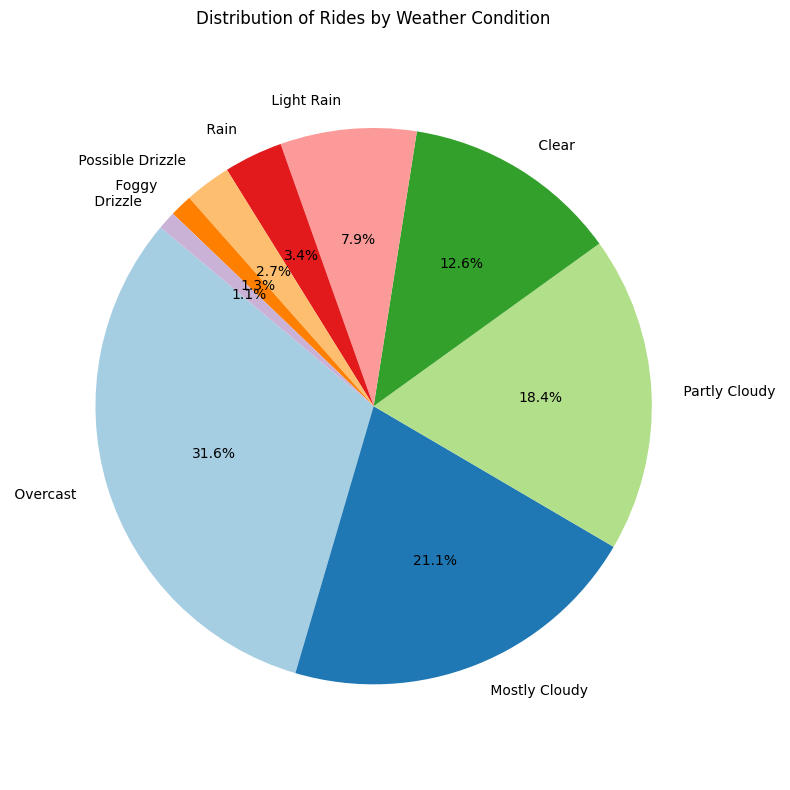

In [ ]:
# To see the distribution of weather across rides
weather_counts = rideshare_df['short_summary'].value_counts()

# Plot pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    weather_counts,
    labels=weather_counts.index,
    autopct='%1.1f%%',  # Show percentages
    startangle=140,     # Rotate start angle for better visuals
    colors=plt.cm.Paired.colors  # Optional: nice color palette
)

plt.title('Distribution of Rides by Weather Condition')
plt.axis('equal')  # Make it a circle
plt.tight_layout()
plt.show()

<ipython-input-17-7c8e511856a4>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=rideshare_df, x='short_summary', y='price', palette='Set3')


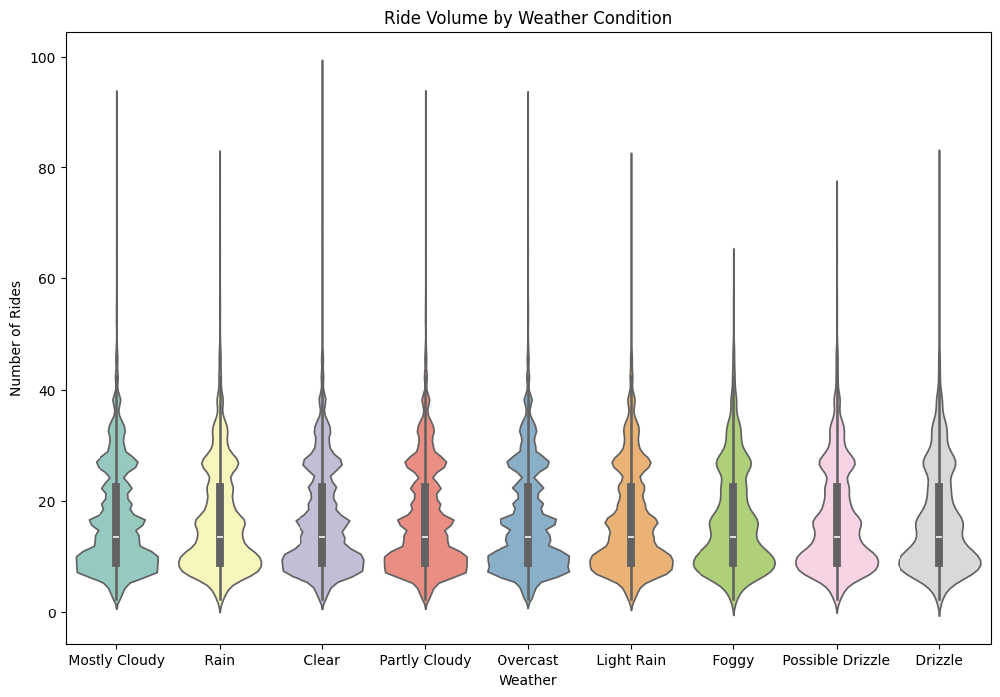

In [ ]:
# Violin plot for the above
plt.figure(figsize=(12, 8))
sns.violinplot(data=rideshare_df, x='short_summary', y='price', palette='Set3')
plt.title('Ride Volume by Weather Condition')
plt.xlabel('Weather')
plt.ylabel('Number of Rides')
plt.show()

(Note: it may seem curious that we had so many visualisations, but we were concerned about the dataset being synthetic; the violin chart was a quick and easy way to visually inspect the distribution of a variable that seemed would have a strong correlation.)

### Average Price by Weather Condition

<ipython-input-19-a6725d4f6d7a>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_price_weather, x='short_summary', y='price', palette='viridis')


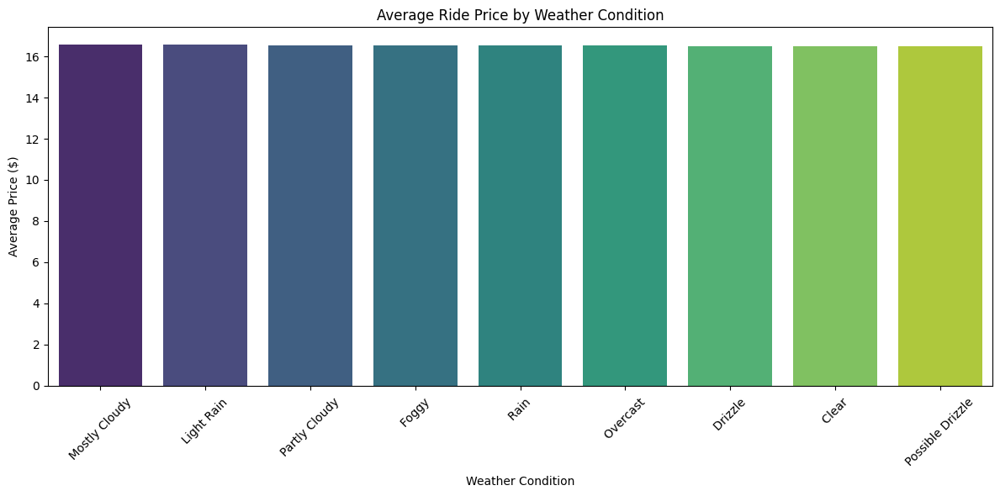

In [ ]:
# Catagorical variables seem a little useless, no real insights.
avg_price_weather = rideshare_df.groupby('short_summary')['price'].mean().reset_index()

# Sort by price (optional, looks cleaner)
avg_price_weather = avg_price_weather.sort_values(by='price', ascending=False)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=avg_price_weather, x='short_summary', y='price', palette='viridis')

plt.title('Average Ride Price by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-20-7d1fa9acc79d>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_surge_by_weather, x='short_summary', y='surge_multiplier', palette='rocket')


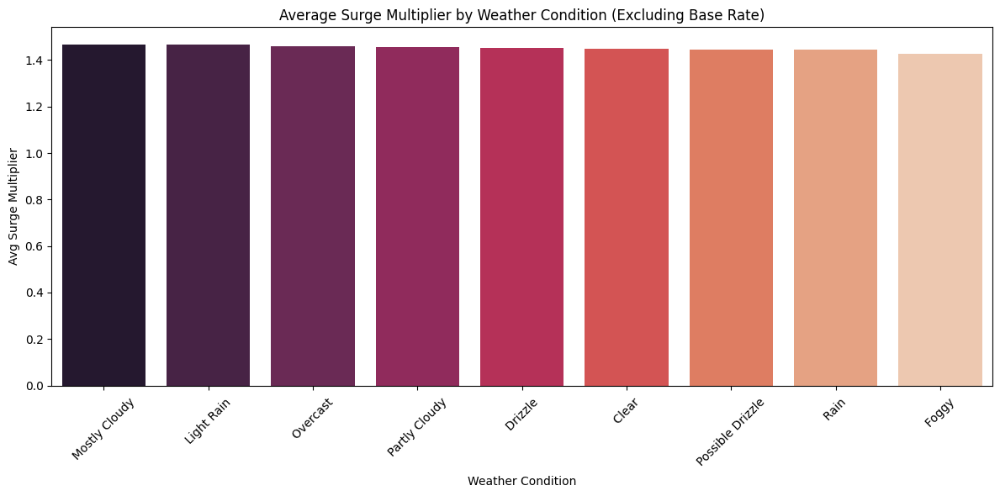

In [ ]:
#Continuing above:
# Filter out normal-priced rides (multiplier = 1)
surged_rides = rideshare_df[rideshare_df['surge_multiplier'] != 1]

# Group by weather and calculate average surge multiplier
avg_surge_by_weather = surged_rides.groupby('short_summary')['surge_multiplier'].mean().reset_index()

# Sort for clean visuals
avg_surge_by_weather = avg_surge_by_weather.sort_values(by='surge_multiplier', ascending=False)

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=avg_surge_by_weather, x='short_summary', y='surge_multiplier', palette='rocket')

plt.title('Average Surge Multiplier by Weather Condition (Excluding Base Rate)')
plt.xlabel('Weather Condition')
plt.ylabel('Avg Surge Multiplier')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

(Again, we thought average price ride may be affected by weather; surges during high volume due to incliment weather, and wanted to explore, however it did not uncover a trend, contrary to our expectations.)